In [ ]:
%load_ext autoreload
%autoreload 2

In [21]:
from helpers.shapedetector import ShapeDetector
from helpers.utils import *
import imutils
import cv2
import requests
import base64
from pathlib import Path

import numpy as np
import re

import uiautomator2 as u2

import cv2
from PIL import Image

import skimage
from skimage import segmentation as skis

from matplotlib import pylab as plt

In [3]:
from pytesseract import Output
import pytesseract

In [5]:
d = u2.connect()

In [7]:
print(d.info)

[D 210102 11:03:36 __init__:600] kill process(ps): uiautomator
[D 210102 11:03:39 __init__:619] uiautomator-v2 is starting ... left: 40.0s
[D 210102 11:03:40 __init__:619] uiautomator-v2 is starting ... left: 39.0s
[D 210102 11:03:41 __init__:619] uiautomator-v2 is starting ... left: 37.9s
[D 210102 11:03:42 __init__:619] uiautomator-v2 is starting ... left: 36.9s
[D 210102 11:03:43 __init__:619] uiautomator-v2 is starting ... left: 35.9s
[D 210102 11:03:44 __init__:619] uiautomator-v2 is starting ... left: 34.9s
[D 210102 11:03:45 __init__:619] uiautomator-v2 is starting ... left: 33.9s
[I 210102 11:03:45 __init__:583] uiautomator back to normal


{'currentPackageName': 'com.nexon.kart', 'displayHeight': 1080, 'displayRotation': 1, 'displaySizeDpX': 640, 'displaySizeDpY': 360, 'displayWidth': 1803, 'productName': 'g3_global_com', 'screenOn': True, 'sdkInt': 19, 'naturalOrientation': False}


In [6]:
sess = d.session("com.nexon.kart")

/Users/rluo/anaconda3/envs/krr/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated method session. (method: session is useless now) -- Deprecated since version 3.0.0.
  """Entry point for launching an IPython kernel.


In [84]:
def ocrtest(d, engine="webimage_loc"):
    d.screenshot('screenshots/current.png')
    with Path("screenshots/current.png").open('rb') as file:
        img = base64.b64encode(file.read())
    general_word_url = f"https://aip.baidubce.com/rest/2.0/ocr/v1/{engine}"
    access_token = get_access_token()
    request_url = general_word_url + "?access_token=" + access_token
    print(request_url)
    params = {"image":img,
              "probability": "true",
             }
    if engine == 'webimage_loc': 
        params["poly_location"] = "true"
    if engine == 'accurate':
        params["vertexes_location"] = "true"
    headers = {'content-type': 'application/x-www-form-urlencoded'}
    response = requests.post(request_url, data=params, headers=headers)
    res = response.json()
    ss_img = np.array(Image.open('screenshots/current.png'))
    for i, word_res in enumerate(res['words_result']):
        prob = word_res['probability']['average']

        text = word_res["words"]
        y, x, w, h = word_res['location']['top'], word_res['location']['left'], word_res['location']['width'], word_res['location']['height']

        # Visualize bbox
        cv2.rectangle(ss_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(ss_img, f"{prob:.2%}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(ss_img, text, (x+100, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    showimg(ss_img)
    return res

In [88]:
def index_results(res):
    indexed = {}
    for w in res['words_result']:
        if w['words'] not in indexed:
            indexed[w['words']] = [w]
        else:
            indexed[w['words']].append(w)
    return indexed

In [60]:
# regular return button 
# d.click(50, 10)

In [78]:
# event page close button
# d.click(1780, 170)
# 1st charge close button
# d.click(1650, 170)

{'refresh_token': '25.4da581ee0ff7bc0a18731a01f56a2d3c.315360000.1924965722.282335-23478728', 'expires_in': 2592000, 'session_key': '9mzdCXIbMxn1EvdXkHht3d9D5J64BLp3z0/QZYw0uVkt6UFm2oLBi/gpMVXw99yj6Mqej0Ipv9w0A+wOHTyI3Zz8NR84Fw==', 'access_token': '24.2d8a325d6e946648e4eee8bed7680736.2592000.1612197722.282335-23478728', 'scope': 'public vis-ocr_ocr brain_ocr_scope brain_ocr_general brain_ocr_general_basic vis-ocr_business_license brain_ocr_webimage brain_all_scope brain_ocr_idcard brain_ocr_driving_license brain_ocr_vehicle_license vis-ocr_plate_number brain_solution brain_ocr_plate_number brain_ocr_accurate brain_ocr_accurate_basic brain_ocr_receipt brain_ocr_business_license brain_solution_iocr brain_qrcode brain_ocr_handwriting brain_ocr_passport brain_ocr_vat_invoice brain_numbers brain_ocr_business_card brain_ocr_train_ticket brain_ocr_taxi_receipt vis-ocr_household_register vis-ocr_vis-classify_birth_certificate vis-ocr_台湾通行证 vis-ocr_港澳通行证 vis-ocr_机动车购车发票识别 vis-ocr_机动车检验合格证识别 vis

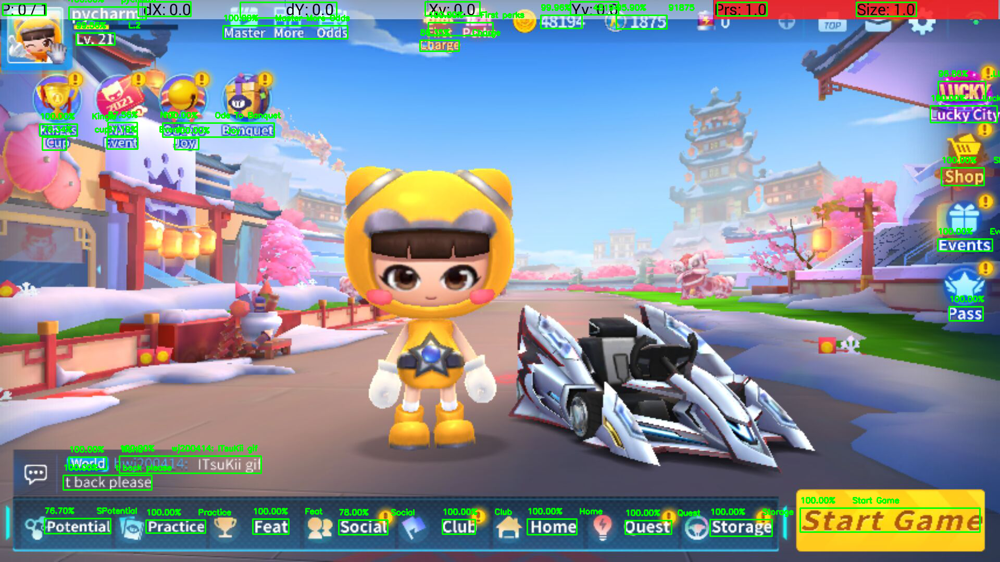

In [90]:
res = ocrtest(d)

In [91]:
indexed_res = index_results(res)

In [92]:
indexed_res['Start Game']

[{'probability': {'average': 1.0, 'min': 1.0, 'variance': 0.0},
  'poly_location': [{'x': 1883, 'y': 1023},
   {'x': 1883, 'y': 979},
   {'x': 1537, 'y': 977},
   {'x': 1537, 'y': 1021}],
  'words': 'Start Game',
  'location': {'top': 976, 'left': 1536, 'width': 345, 'height': 46},
  'chars': []}]

In [93]:
d.click(1700, 1000)

{'refresh_token': '25.77539cb6fab72ac7b4885300c0b40219.315360000.1924965832.282335-23478728', 'expires_in': 2592000, 'session_key': '9mzdAqZ9frgLxEqPglxvMIRbcDakQFJdXQXs++emXlMwVyqlR6koti+H9jo4xXJ2Ut+DuKGCPvi0SY3cjG8j3EuV6Goeyw==', 'access_token': '24.9d2662fe705f92039f296e067ec4927b.2592000.1612197832.282335-23478728', 'scope': 'public vis-ocr_ocr brain_ocr_scope brain_ocr_general brain_ocr_general_basic vis-ocr_business_license brain_ocr_webimage brain_all_scope brain_ocr_idcard brain_ocr_driving_license brain_ocr_vehicle_license vis-ocr_plate_number brain_solution brain_ocr_plate_number brain_ocr_accurate brain_ocr_accurate_basic brain_ocr_receipt brain_ocr_business_license brain_solution_iocr brain_qrcode brain_ocr_handwriting brain_ocr_passport brain_ocr_vat_invoice brain_numbers brain_ocr_business_card brain_ocr_train_ticket brain_ocr_taxi_receipt vis-ocr_household_register vis-ocr_vis-classify_birth_certificate vis-ocr_台湾通行证 vis-ocr_港澳通行证 vis-ocr_机动车购车发票识别 vis-ocr_机动车检验合格证识别 vis

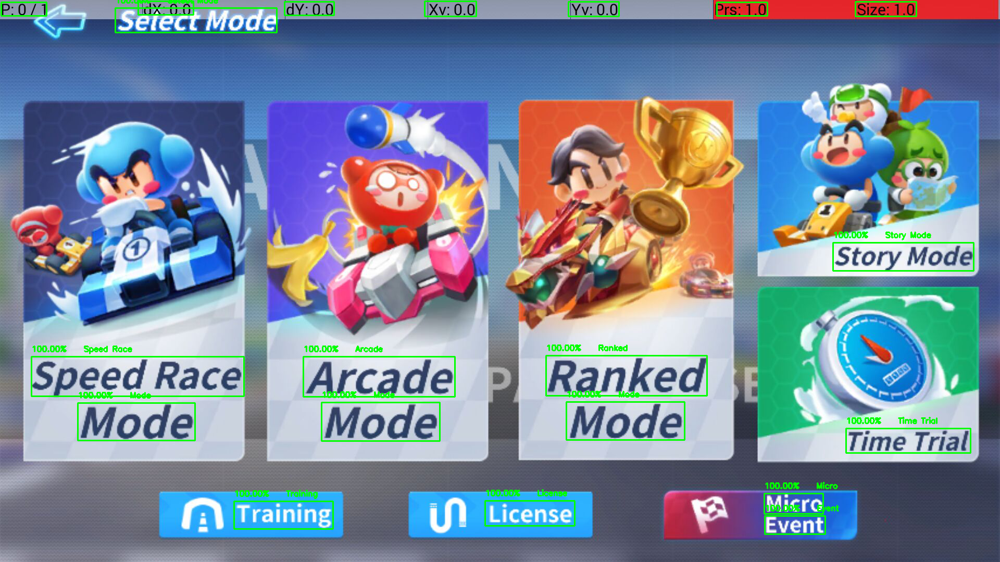

In [94]:
res = ocrtest(d)

In [95]:
indexed_res = index_results(res)

In [96]:
indexed_res['Time Trial']

[{'probability': {'average': 1.0, 'min': 1.0, 'variance': 0.0},
  'poly_location': [{'x': 1624, 'y': 871},
   {'x': 1864, 'y': 871},
   {'x': 1864, 'y': 824},
   {'x': 1624, 'y': 824}],
  'words': 'Time Trial',
  'location': {'top': 823, 'left': 1624, 'width': 239, 'height': 47},
  'chars': []}]

In [97]:
d.click(1700, 850)

{'refresh_token': '25.5ca0b34a4931afdf4ded6fc4acf29a05.315360000.1924965879.282335-23478728', 'expires_in': 2592000, 'session_key': '9mzdA5x0YCPFtBgVzBoPbEd9VG7sBxx4/75SH4rLPe7XRuGy73DrDqpU9zyw32pZYlzDgARgiCSqevoEDdQMyp4wTUcQYw==', 'access_token': '24.864c2e60bdd1292804fd12f875c3d2e2.2592000.1612197879.282335-23478728', 'scope': 'public vis-ocr_ocr brain_ocr_scope brain_ocr_general brain_ocr_general_basic vis-ocr_business_license brain_ocr_webimage brain_all_scope brain_ocr_idcard brain_ocr_driving_license brain_ocr_vehicle_license vis-ocr_plate_number brain_solution brain_ocr_plate_number brain_ocr_accurate brain_ocr_accurate_basic brain_ocr_receipt brain_ocr_business_license brain_solution_iocr brain_qrcode brain_ocr_handwriting brain_ocr_passport brain_ocr_vat_invoice brain_numbers brain_ocr_business_card brain_ocr_train_ticket brain_ocr_taxi_receipt vis-ocr_household_register vis-ocr_vis-classify_birth_certificate vis-ocr_台湾通行证 vis-ocr_港澳通行证 vis-ocr_机动车购车发票识别 vis-ocr_机动车检验合格证识别 vis

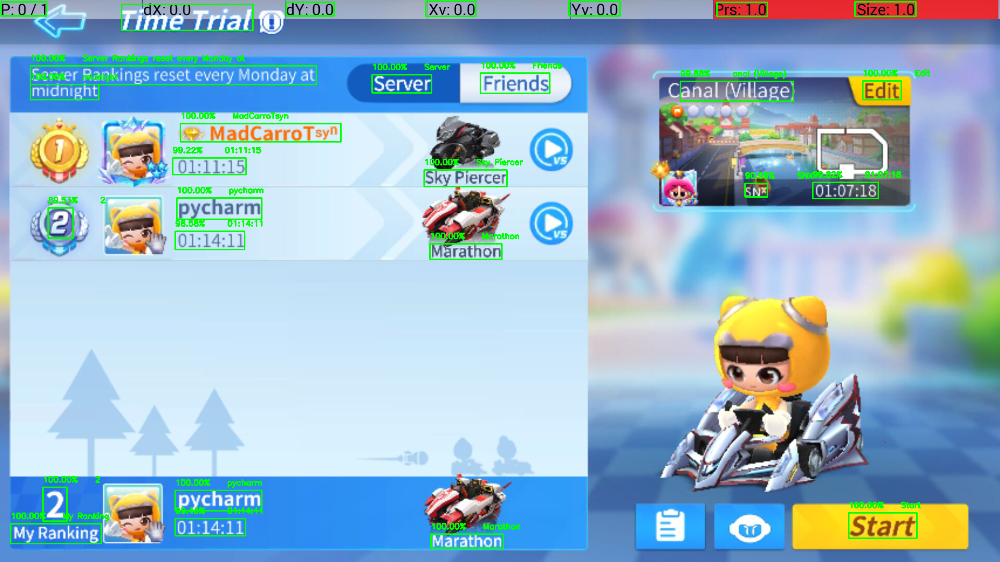

In [98]:
res = ocrtest(d)

In [99]:
indexed_res = index_results(res)

In [100]:
indexed_res['Edit']

[{'probability': {'average': 1.0, 'min': 1.0, 'variance': 0.0},
  'poly_location': [{'x': 1730, 'y': 192},
   {'x': 1730, 'y': 156},
   {'x': 1656, 'y': 156},
   {'x': 1656, 'y': 192}],
  'words': 'Edit',
  'location': {'top': 155, 'left': 1656, 'width': 74, 'height': 36},
  'chars': []}]

In [101]:
d.click(1700, 170)

{'refresh_token': '25.b5be456f39df9bfa9e30e61c3cedc78e.315360000.1924965953.282335-23478728', 'expires_in': 2592000, 'session_key': '9mzdXU3W1srEW+qRCPOF1h4hoOfk60fDEaVNAXVyWgN8G8TqyjejacN9yNu6h+SD8TTYZuoPLrB1+V9FUUUO7t1eAi2PKA==', 'access_token': '24.f92536a750b9df04fba8120c8299b9f0.2592000.1612197953.282335-23478728', 'scope': 'public vis-ocr_ocr brain_ocr_scope brain_ocr_general brain_ocr_general_basic vis-ocr_business_license brain_ocr_webimage brain_all_scope brain_ocr_idcard brain_ocr_driving_license brain_ocr_vehicle_license vis-ocr_plate_number brain_solution brain_ocr_plate_number brain_ocr_accurate brain_ocr_accurate_basic brain_ocr_receipt brain_ocr_business_license brain_solution_iocr brain_qrcode brain_ocr_handwriting brain_ocr_passport brain_ocr_vat_invoice brain_numbers brain_ocr_business_card brain_ocr_train_ticket brain_ocr_taxi_receipt vis-ocr_household_register vis-ocr_vis-classify_birth_certificate vis-ocr_台湾通行证 vis-ocr_港澳通行证 vis-ocr_机动车购车发票识别 vis-ocr_机动车检验合格证识别 vis

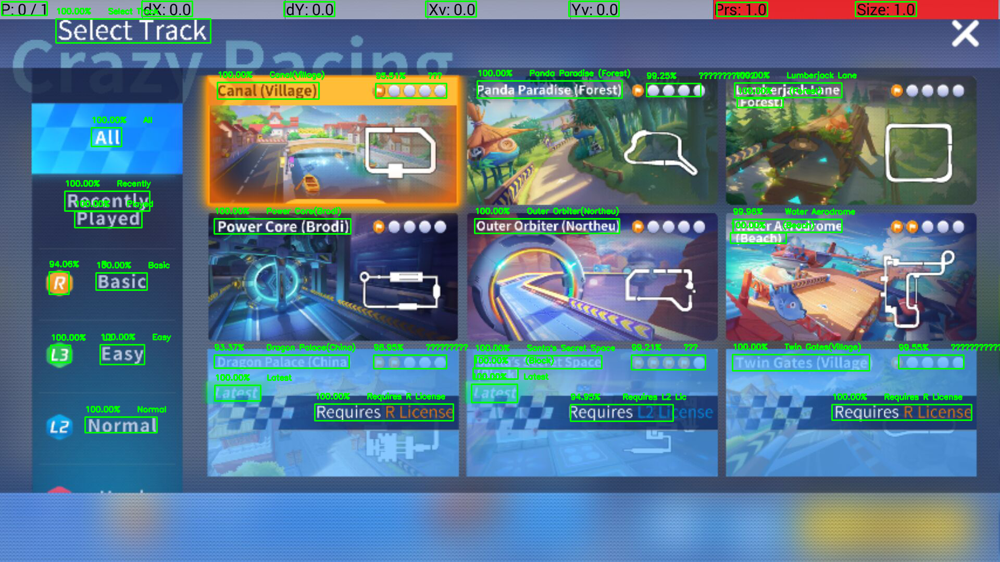

In [102]:
res = ocrtest(d)

In [101]:
d.click(1700, 170)